<a href="https://colab.research.google.com/github/prajwalgotmare/Lego_Minifigure_Face_Detection/blob/main/Lego_Face_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Downloading the dataset from Kaggle using kaggle.json

In [4]:
# Refer this Youtube video if you are having any confusion : https://youtu.be/gwDOUuBH7ws

import os
os.environ["KAGGLE_CONFIG_DIR"] = "/content/drive/MyDrive/kaggle_dataset"
!kaggle datasets download -d ihelon/lego-minifigure-faces

 61% 7.00M/11.5M [00:00<00:00, 73.0MB/s]
100% 11.5M/11.5M [00:00<00:00, 31.6MB/s]


In [5]:
!unzip /content/lego-minifigure-faces.zip && rm /content/lego-minifigure-faces.zip

Archive:  /content/lego-minifigure-faces.zip
  inflating: 00/0001.jpg             
  inflating: 00/0002.jpg             
  inflating: 00/0003.jpg             
  inflating: 00/0004.jpg             
  inflating: 00/0005.jpg             
  inflating: 00/0006.jpg             
  inflating: 00/0007.jpg             
  inflating: 00/0008.jpg             
  inflating: 00/0009.jpg             
  inflating: 00/0010.jpg             
  inflating: 00/0011.jpg             
  inflating: 00/0012.jpg             
  inflating: 00/0013.jpg             
  inflating: 00/0014.jpg             
  inflating: 00/0015.jpg             
  inflating: 00/0016.jpg             
  inflating: 00/0017.jpg             
  inflating: 00/0018.jpg             
  inflating: 00/0019.jpg             
  inflating: 00/0020.jpg             
  inflating: 00/0021.jpg             
  inflating: 00/0022.jpg             
  inflating: 00/0023.jpg             
  inflating: 00/0024.jpg             
  inflating: 00/0025.jpg             
  inf

# Installing all the required libraries

In [4]:
!pip install Pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Displaying 1 Image Using Python Imaging Library.

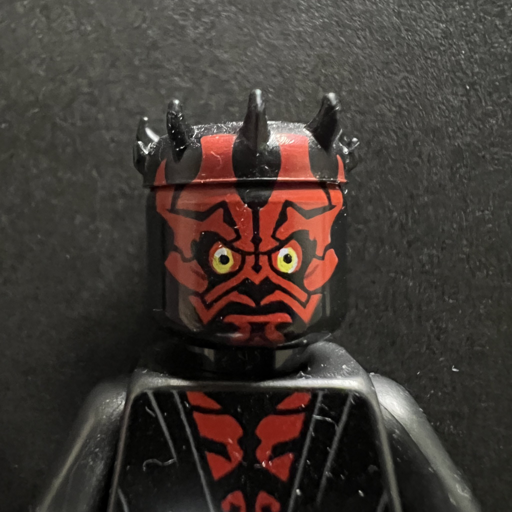

In [6]:
from PIL import Image

# open image
img = Image.open("/content/00/0001.jpg")

# resize image to 50% of original size as original is too large to display
img = img.resize((int(img.size[0]*0.5), int(img.size[1]*0.5)))

# show image
img.show()

# Detecting Faces using **Haar-cascade Detection in OpenCV**

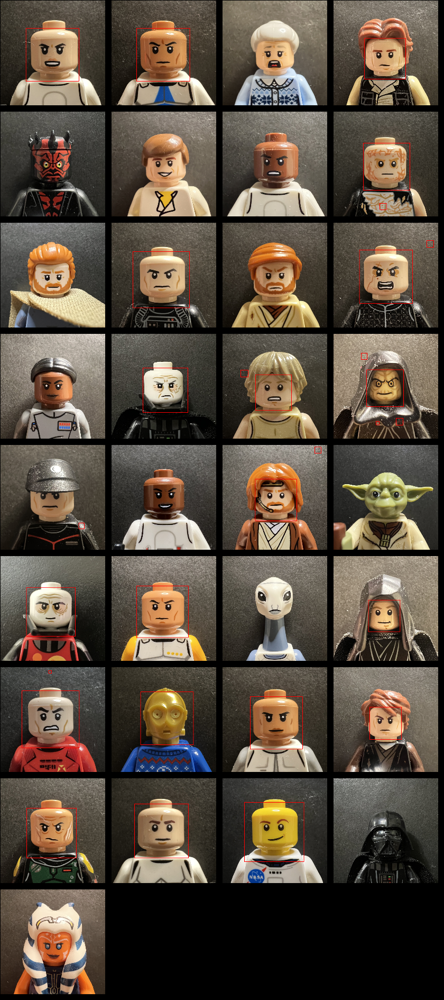

In [9]:
import os
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# load the pre-trained face detection classifier
face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')

# set output directory
output_folder = 'output/'

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# define grid properties
num_cols = 4
grid_spacing = 10
grid_width = 200
grid_height = 200

# initialize output grid
num_rows = int(np.ceil(33 / num_cols))
grid = np.zeros((num_rows*(grid_height+grid_spacing), num_cols*(grid_width+grid_spacing), 3), dtype=np.uint8)

# loop over all image files in the input folder
for i, file in enumerate(os.listdir('/content/00')):
    if file.lower().endswith(('.png', '.jpg', '.jpeg')):
        # load input image
        img_path = os.path.join('/content/00', file)
        img = cv2.imread(img_path)

        if img is None:
            print(f'Error: Failed to load image file at {img_path}')
            continue

        # convert to grayscale
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # detect faces in the image
        faces = face_cascade.detectMultiScale(gray_img, scaleFactor=1.1, minNeighbors=5)

        # loop over the detected faces and draw rectangles around them
        for (x, y, w, h) in faces:
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 4)

        # resize image to fit in grid
        img = cv2.resize(img, (grid_width-2, grid_height-2))

        # add image to output grid
        col = i % num_cols
        row = i // num_cols
        x = col * (grid_width + grid_spacing)
        y = row * (grid_height + grid_spacing)
        grid[y+1:y+grid_height-1, x+1:x+grid_width-1] = img

# display the output grid
cv2_imshow(grid)
cv2.waitKey(0)
cv2.destroyAllWindows()


## **Conclusion :** As, we can manually observe that we are not getting 100% accuracy using "Haar-cascade Detection" method. So, We will try to explore another methods available. 

# Using face_recognition Python package

In [2]:
!pip install face_recognition

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 10.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566185 sha256=c2acdd301c37ea71c773a1bea4260fe21e3393f06ea41916999b1b71be468418
  Stored in directory: /root/.cache/pip/wheels/22/a8/60/4a2aeb763d63f50190f4c4e07069a22245347eeafdb3a67551
Successfully built face-recognition-models


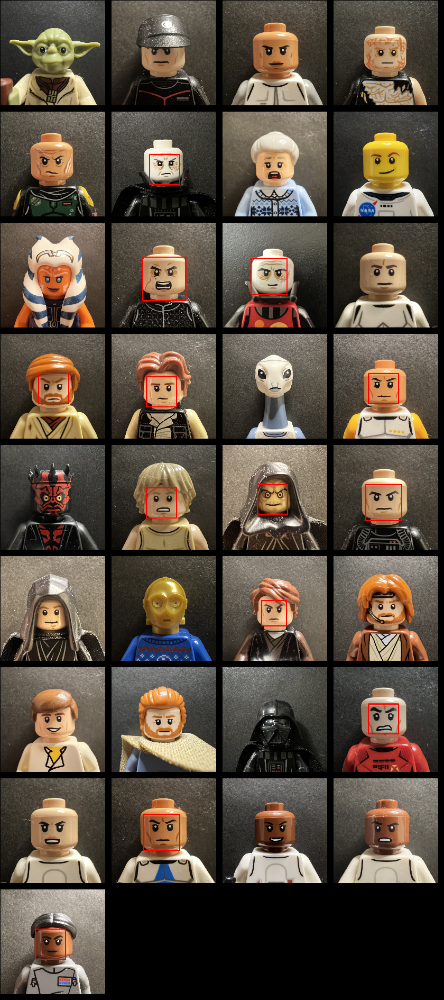

In [8]:
import os
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import face_recognition

# set output directory
output_folder = 'output/'

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# define grid properties
num_cols = 4
grid_spacing = 10
grid_width = 200
grid_height = 200

# initialize output grid
num_rows = int(np.ceil(33 / num_cols))
grid = np.zeros((num_rows*(grid_height+grid_spacing), num_cols*(grid_width+grid_spacing), 3), dtype=np.uint8)

# loop over all image files in the input folder
for i, file in enumerate(os.listdir('/content/00')):
    if file.lower().endswith(('.png', '.jpg', '.jpeg')):
        # load input image
        img_path = os.path.join('/content/00', file)
        img = cv2.imread(img_path)

        if img is None:
            print(f'Error: Failed to load image file at {img_path}')
            continue

        # detect faces in the image
        # Which face detection model to use. “hog” is less accurate but faster on CPUs.
        # “cnn” is a more accurate deep-learning model which is GPU/CUDA accelerated (if available). The default is “hog”.

        face_locations = face_recognition.face_locations(img, model='cnn')

        # loop over the detected faces and draw rectangles around them
        for (top, right, bottom, left) in face_locations:
            cv2.rectangle(img, (left, top), (right, bottom), (0, 0, 255), 10)

        # resize image to fit in grid
        img = cv2.resize(img, (grid_width-2, grid_height-2))

        # add image to output grid
        col = i % num_cols
        row = i // num_cols
        x = col * (grid_width + grid_spacing)
        y = row * (grid_height + grid_spacing)
        grid[y+1:y+grid_height-1, x+1:x+grid_width-1] = img

# display the output grid
cv2_imshow(grid)
cv2.waitKey(0)
cv2.destroyAllWindows()


## **Conclusion :** As, we can manually observe the results using face_detection library is not also great both hog and cnn model.

2/2 [==============================] - 0s 7ms/step


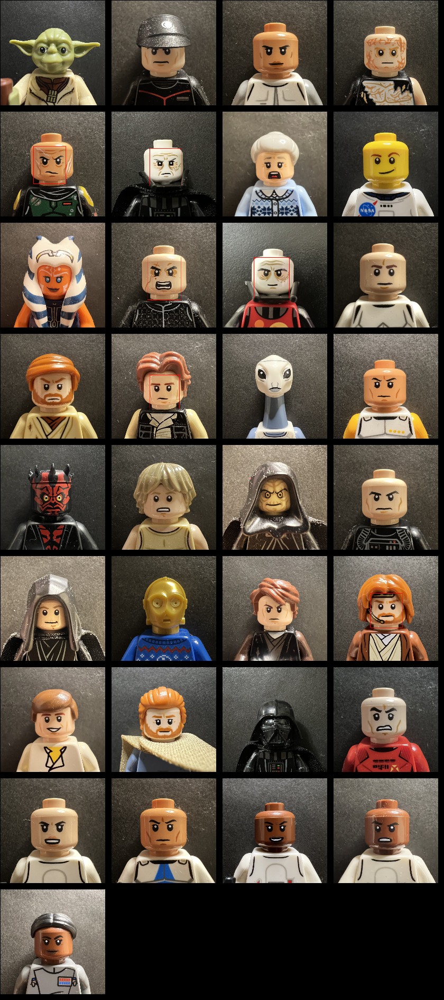

In [11]:
import os
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from mtcnn import MTCNN

# set output directory
output_folder = 'output/'

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# define grid properties
num_cols = 4
grid_spacing = 10
grid_width = 200
grid_height = 200

# initialize output grid
num_rows = int(np.ceil(33 / num_cols))
grid = np.zeros((num_rows*(grid_height+grid_spacing), num_cols*(grid_width+grid_spacing), 3), dtype=np.uint8)

# initialize MTCNN detector
detector = MTCNN()

# loop over all image files in the input folder
for i, file in enumerate(os.listdir('/content/00')):
    if file.lower().endswith(('.png', '.jpg', '.jpeg')):
        # load input image
        img_path = os.path.join('/content/00', file)
        img = cv2.imread(img_path)

        if img is None:
            print(f'Error: Failed to load image file at {img_path}')
            continue

        # detect faces in the image
        detections = detector.detect_faces(img)

        # loop over the detected faces and draw rectangles around them
        for detection in detections:
            x, y, w, h = detection['box']
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 2)

        # resize image to fit in grid
        img = cv2.resize(img, (grid_width-2, grid_height-2))

        # add image to output grid
        col = i % num_cols
        row = i // num_cols
        x = col * (grid_width + grid_spacing)
        y = row * (grid_height + grid_spacing)
        grid[y+1:y+grid_height-1, x+1:x+grid_width-1] = img

# display the output grid
cv2_imshow(grid)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [10]:
pip install mtcnn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 71.1 MB/s eta 0:00:00


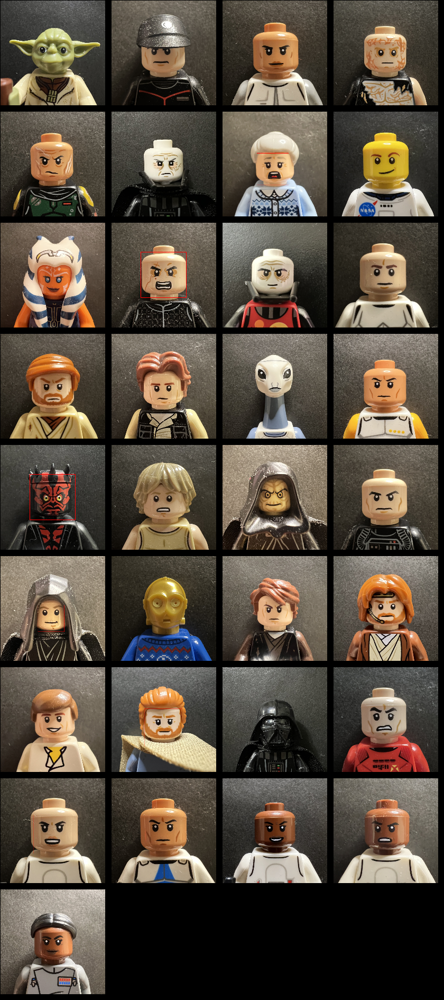

In [12]:
import os
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import dlib

# set output directory
output_folder = 'output/'

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# define grid properties
num_cols = 4
grid_spacing = 10
grid_width = 200
grid_height = 200

# initialize output grid
num_rows = int(np.ceil(33 / num_cols))
grid = np.zeros((num_rows*(grid_height+grid_spacing), num_cols*(grid_width+grid_spacing), 3), dtype=np.uint8)

# initialize face detector
detector = dlib.get_frontal_face_detector()

# loop over all image files in the input folder
for i, file in enumerate(os.listdir('/content/00')):
    if file.lower().endswith(('.png', '.jpg', '.jpeg')):
        # load input image
        img_path = os.path.join('/content/00', file)
        img = cv2.imread(img_path)

        if img is None:
            print(f'Error: Failed to load image file at {img_path}')
            continue

        # detect faces in the image
        face_rects = detector(img, 0)

        # loop over the detected faces and draw rectangles around them
        for rect in face_rects:
            cv2.rectangle(img, (rect.left(), rect.top()), (rect.right(), rect.bottom()), (0, 0, 255), 2)

        # resize image to fit in grid
        img = cv2.resize(img, (grid_width-2, grid_height-2))

        # add image to output grid
        col = i % num_cols
        row = i // num_cols
        x = col * (grid_width + grid_spacing)
        y = row * (grid_height + grid_spacing)
        grid[y+1:y+grid_height-1, x+1:x+grid_width-1] = img

# display the output grid
cv2_imshow(grid)
cv2.waitKey(0)
cv2.destroyAllWindows()
